In [ ]:
import torch
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

In [ ]:
# ! unzip -o /content/drive/MyDrive/TYOLO/dataset.zip -d "/content/drive/MyDrive/TYOLO"

In [ ]:
# ! unzip -o /content/drive/MyDrive/TYOLO/dataset/labels.zip -d "/content/drive/MyDrive/TYOLO/dataset"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003363.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003367.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003377.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003381.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003382.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003386.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003395.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003580.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003581.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003583.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003584.txt  
  inflating: /content/drive/MyDrive/TYOLO/dataset/labels/frame_003589.txt  
  inflating: /content/drive/MyDrive/T

In [ ]:
# ! rm -r /content/drive/MyDrive/TYOLO/dataset/labels

In [ ]:
!python /content/drive/MyDrive/TYOLO/yolov5/train.py --img 640 --batch 16 --epochs 5 --data lara2.yaml --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=lara2.yaml, hyp=drive/MyDrive/TYOLO/yolov5/data/hyps/hyp.scratch.yaml, epochs=5, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=drive/MyDrive/TYOLO/yolov5/runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 v6.0-37-g620b535 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, 

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
img1 = Image.open('/content/drive/MyDrive/DASC-Datasets/Images/image1.jpg')
result = model(img1)

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 282 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 283 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 34853 had too many entries: 2, expected 1
  % (tag, len(values))


In [ ]:
model_new = torch.load('yolov5s.pt')

FileNotFoundError: ignored

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


ImportError: ignored

In [ ]:
image = cv2.imread('/content/drive/MyDrive/DASC-Datasets/Images/image2.jpg')

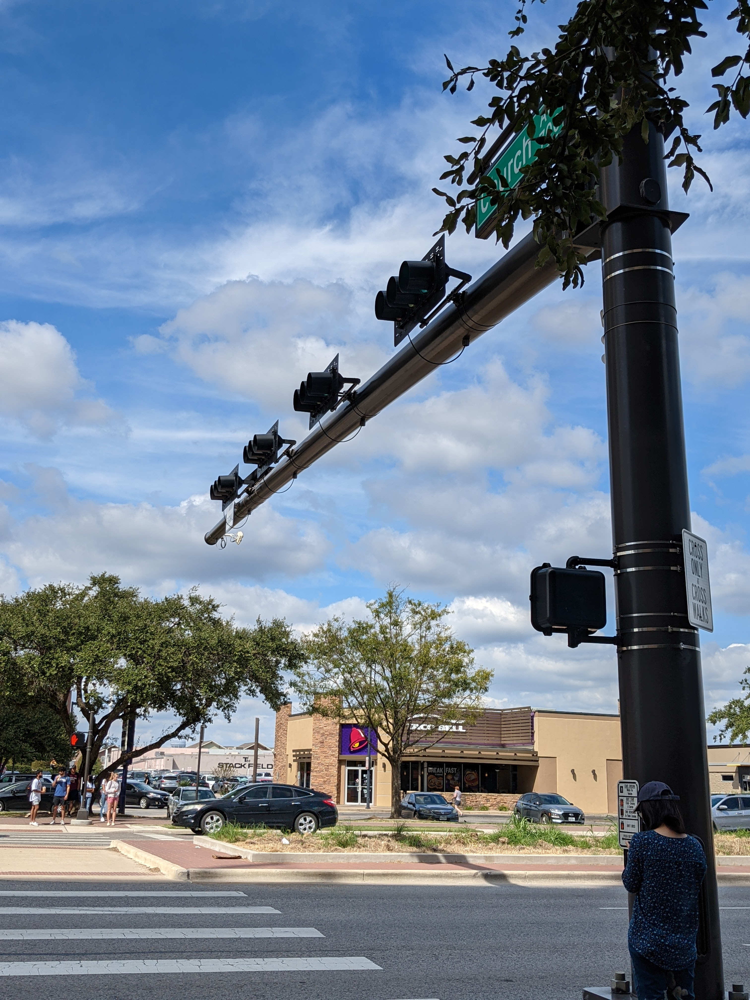

In [ ]:
cv2_imshow(image)

In [ ]:
result.print()
result.show()

image 1/1: 4032x3024 (no detections)
Speed: 362.7ms pre-process, 38.2ms inference, 1.1ms NMS per image at shape (1, 3, 640, 480)


In [ ]:
result.save()

Saved 1 image to runs/detect/exp


In [ ]:
result.xyxy[0]

tensor([], device='cuda:0', size=(0, 6))

In [ ]:
model = torch.hub.load('/content/drive/MyDrive/TYOLO/yolov5', 'custom', path='/content/drive/MyDrive/TYOLO/yolov5/yolov5s.pt', source='local')

requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 v6.0-37-g620b535 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)




requirements: 1 package updated per /content/drive/MyDrive/TYOLO/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
import numpy as np
import time
import cv2
import imutils
from imutils.video import FPS
from imutils.video import VideoStream



INPUT_FILE='traffic_1.mp4'
OUTPUT_FILE='output.avi'
LABELS_FILE='data/coco.names'
CONFIG_FILE='cfg/yolov3.cfg'
WEIGHTS_FILE='yolov3.weights'
CONFIDENCE_THRESHOLD=0.3

H=None
W=None

fps = FPS().start()

fourcc = cv2.VideoWriter_fourcc(*"MJPG")
writer = cv2.VideoWriter(OUTPUT_FILE, fourcc, 30,
	(800, 600), True)

# LABELS = open(LABELS_FILE).read().strip().split("\n")
LABELS = ['Traffic Light']

np.random.seed(4)
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3),
	dtype="uint8")


net = cv2.dnn.readNetFromDarknet(CONFIG_FILE, WEIGHTS_FILE)

vs = cv2.VideoCapture(INPUT_FILE)


# determine only the *output* layer names that we need from YOLO
ln = net.getLayerNames()
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
cnt =0;
while True:
	cnt+=1
	print ("Frame number", cnt)
	try:
		(grabbed, image) = vs.read()
	except:
		break
	blob = cv2.dnn.blobFromImage(image, 1 / 255.0, (416, 416),
		swapRB=True, crop=False)
	net.setInput(blob)
	if W is None or H is None:
		(H, W) = image.shape[:2]
	layerOutputs = net.forward(ln)






	# initialize our lists of detected bounding boxes, confidences, and
	# class IDs, respectively
	boxes = []
	confidences = []
	classIDs = []

	# loop over each of the layer outputs
	for output in layerOutputs:
		# loop over each of the detections
		for detection in output:
			# extract the class ID and confidence (i.e., probability) of
			# the current object detection
			scores = detection[5:]
			classID = np.argmax(scores)
			confidence = scores[classID]

			# filter out weak predictions by ensuring the detected
			# probability is greater than the minimum probability
			if confidence > CONFIDENCE_THRESHOLD:
				# scale the bounding box coordinates back relative to the
				# size of the image, keeping in mind that YOLO actually
				# returns the center (x, y)-coordinates of the bounding
				# box followed by the boxes' width and height
				box = detection[0:4] * np.array([W, H, W, H])
				(centerX, centerY, width, height) = box.astype("int")

				# use the center (x, y)-coordinates to derive the top and
				# and left corner of the bounding box
				x = int(centerX - (width / 2))
				y = int(centerY - (height / 2))

				# update our list of bounding box coordinates, confidences,
				# and class IDs
				boxes.append([x, y, int(width), int(height)])
				confidences.append(float(confidence))
				classIDs.append(classID)

	# apply non-maxima suppression to suppress weak, overlapping bounding
	# boxes
	idxs = cv2.dnn.NMSBoxes(boxes, confidences, CONFIDENCE_THRESHOLD,
		CONFIDENCE_THRESHOLD)

	# ensure at least one detection exists
	if len(idxs) > 0:
		# loop over the indexes we are keeping
		for i in idxs.flatten():
			# extract the bounding box coordinates
			(x, y) = (boxes[i][0], boxes[i][1])
			(w, h) = (boxes[i][2], boxes[i][3])

			color = [int(c) for c in COLORS[classIDs[i]]]

			cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
			text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
			cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,
				0.5, color, 2)

	# show the output image
	cv2.imshow("output", cv2.resize(image,(800, 600)))
	writer.write(cv2.resize(image,(800, 600)))
	fps.update()
	key = cv2.waitKey(1) & 0xFF
	if key == ord("q"):
		break

fps.stop()

print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))

# do a bit of cleanup
cv2.destroyAllWindows()

# release the file pointers
print("[INFO] cleaning up...")
writer.release()
vs.release()

In [ ]:
import numpy as np
import time
import cv2
import imutils
from imutils.video import FPS
from imutils.video import VideoStream

vs = cv2.VideoCapture('/content/drive/MyDrive/TYOLO/Driving_day_test.mp4')
writer = None
(W, H) = (None, None)
# try to determine the total number of frames in the video file
try:
	prop = cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
		else cv2.CAP_PROP_FRAME_COUNT
	total = int(vs.get(prop))
	print("[INFO] {} total frames in video".format(total))
# an error occurred while trying to determine the total
# number of frames in the video file
except:
	print("[INFO] could not determine # of frames in video")
	print("[INFO] no approx. completion time can be provided")
	total = -1


[INFO] 527 total frames in video


In [ ]:
cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)
			text = "{}: {:.4f}".format(LABELS[classIDs[i]],
				confidences[i])
			cv2.putText(frame, text, (x, y - 5),
				cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

In [ ]:
count = 0
while True:
  # read the next frame from the file
  (grabbed, frame) = vs.read()
  if count==0 :
    f = frame
    count+=1
  # if the frame was not grabbed, then we have reached the end
  # of the stream
  if not grabbed:
    break
  # if the frame dimensions are empty, grab them
  if W is None or H is None:
    (H, W) = frame.shape[:2]

  start = time.time()
  layerOutputs = model(frame)
  # print(layerOutputs)
  layerOutputs.print()
  # print(len(layerOutputs.xyxy[0]))
  if len(layerOutputs.xyxy[0]) > 0 :
    for i in layerOutputs.xyxy[0] :
      try:
        cv2.rectangle(frame, (i[0], i[1]), (i[2], i[3]), (255,255,255), 2)
        plt.imshow(frame)
        break
      except:
        continue
  end = time.time()


  if writer is None:
    # initialize our video writer
    fourcc = cv2.VideoWriter_fourcc(*"MJPG")
    writer = cv2.VideoWriter("/content/drive/MyDrive/TYOLO/Test2.mp4", fourcc, 30,
      (frame.shape[1], frame.shape[0]), True)
    # some information on processing single frame
    if total > 0:
      elap = (end - start)
      print("[INFO] single frame took {:.4f} seconds".format(elap))
      print("[INFO] estimated total time to finish: {:.4f}".format(
        elap * total))
  # write the output frame to disk
  writer.write(frame)
  # release the file pointers
print("[INFO] cleaning up...")
writer.release()
vs.release()


image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.7ms pre-process, 33.9ms inference, 2.5ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.4ms pre-process, 29.6ms inference, 4.1ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.2ms pre-process, 29.2ms inference, 2.2ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.3ms pre-process, 29.9ms inference, 4.3ms NMS per image at shape (1, 3, 384, 640)


[INFO] single frame took 0.0556 seconds
[INFO] estimated total time to finish: 29.2870


image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.1ms pre-process, 29.5ms inference, 2.3ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.7ms pre-process, 29.2ms inference, 3.8ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.4ms pre-process, 29.2ms inference, 2.4ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.2ms pre-process, 29.3ms inference, 2.3ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.3ms pre-process, 29.2ms inference, 2.4ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.1ms pre-process, 29.2ms inference, 2.6ms NMS per image at shape (1, 3, 384, 640)
image 1/1: 720x1280 1 person, 7 cars, 2 traffic lights
Speed: 2.0ms pre-process, 29.6ms inference, 2.1ms NMS per image at shape (1

[INFO] cleaning up...


In [ ]:
print(layerOutputs)

In [ ]:
img = cv2.imread('/content/test3.jpg')
pred = model(img)

In [ ]:
pred.xyxy

[tensor([], device='cuda:0', size=(0, 6))]

In [ ]:
for i in pred.xyxy[0] :
  print(i)

In [ ]:
!python3 "/content/drive/MyDrive/TYOLO/yolov5/detect.py" --source "/content/drive/MyDrive/TYOLO/Lara_Test.mp4" --weights "/content/drive/MyDrive/TYOLO/yolov5/runs/train/exp4/weights/best.pt"

detect: weights=['/content/drive/MyDrive/TYOLO/yolov5/runs/train/exp4/weights/best.pt'], source=/content/drive/MyDrive/TYOLO/Lara_Test.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/TYOLO/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-37-g620b535 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
video 1/